## BERTopic and NER

In [ ]:
from bertopic import BERTopic
import pandas as pd

df = pd.read_csv(r"C:\Users\Philippa\Documents\GitHub\crystalline-mining\data\extracted_pdf_info.csv")

df.head()

,pdf_text,metadata
0,['NATURAL CALCIUM CARBONATE FOR BIOMEDICAL APP...,"{'Author': 'ismail - [2010]', 'Creator': 'Micr..."
1,['Hyperbolic Molecular Representation Learning...,"{'Author': '', 'CreationDate': 'D:202208150023..."
2,['4202 peS 81 ]YS.ssee[ 1v21711.9042:viXra Rev...,"{'Producer': 'GPL Ghostscript 10.01.2', 'Creat..."
3,['SEMI-SUPERVISED HIERARCHICAL DRUG EMBEDDING ...,"{'Author': '', 'CreationDate': 'D:202006020057..."
4,['IEEE/ACM TRANSACTIONS ON COMPUTATIONAL BIOLO...,"{'Author': '', 'CreationDate': 'D:201805220140..."


In [16]:
# remove any number digits
df['text_clean'] = (
    df['pdf_text']
      .str.replace(r'\d+', '', regex=True)
      .str.replace(r'\s+', ' ', regex=True)
      .str.strip()
)

In [17]:
df.head()

,pdf_text,metadata,text_clean
0,['NATURAL CALCIUM CARBONATE FOR BIOMEDICAL APP...,"{'Author': 'ismail - [2010]', 'Creator': 'Micr...",['NATURAL CALCIUM CARBONATE FOR BIOMEDICAL APP...
1,['Hyperbolic Molecular Representation Learning...,"{'Author': '', 'CreationDate': 'D:202208150023...",['Hyperbolic Molecular Representation Learning...
2,['4202 peS 81 ]YS.ssee[ 1v21711.9042:viXra Rev...,"{'Producer': 'GPL Ghostscript 10.01.2', 'Creat...",[' peS ]YS.ssee[ v.:viXra Revolutionizing Phar...
3,['SEMI-SUPERVISED HIERARCHICAL DRUG EMBEDDING ...,"{'Author': '', 'CreationDate': 'D:202006020057...",['SEMI-SUPERVISED HIERARCHICAL DRUG EMBEDDING ...
4,['IEEE/ACM TRANSACTIONS ON COMPUTATIONAL BIOLO...,"{'Author': '', 'CreationDate': 'D:201805220140...",['IEEE/ACM TRANSACTIONS ON COMPUTATIONAL BIOLO...


In [59]:
## NER to extract nouns
import spacy
spacy.prefer_gpu()
nlp = spacy.load("en_core_web_lg")

In [19]:
texts = df["text_clean"].values.copy()
docs = []

for idx, doc in enumerate(nlp.pipe(texts, batch_size=100), start=1):
    docs.append(doc)
    
    if idx % 100 == 0:
        print(f"Processed {idx} docs.")

Processed 100 docs.
Processed 200 docs.
Processed 300 docs.
Processed 400 docs.
Processed 500 docs.
Processed 600 docs.
Processed 700 docs.
Processed 800 docs.
Processed 900 docs.


In [214]:
texts[0]

'[\'NATURAL CALCIUM CARBONATE FOR BIOMEDICAL APPLICATIONS A thesis submitted in partial fulfilment for the degree of MASTER OF TECHNOLOGY (INTEGRATED) IN BIOTECHNOLOGY Submitted by SONALI SUDHIR SALI Under the Guidance of Dr. S. VIJAYALAKSHMI CENTRE FOR RESEARCH IN NANOTECHNOLOGY AND SCIENCE INDIAN INSTITUTE OF TECHNOLOGY – BOMBAY (IITB) Powai, Mumbai – . SCHOOL OF BIOTECHNOLOGY AND BIOINFORMATICS D. Y. PATIL UNIVERSITY MAY – \', \'i\', \'ii\', \'iii\', \'Dedicated to my mother… iv\', \'ACKNOWLEDGEMENTS This thesis would simply not have been possible without the work, guidance and endless belief and support of my guide Dr. S. Vijayalakshmi. She really did show me what it takes to pursue research and kept me going. Her patient, modest and kind nature helped me understand and do better. Her warm words of appreciation and encouragement made me want to go ahead in the field, which will never be forgotten. I would also like to thank Mohammad Furquan who helped and supported throughout the p

In [ ]:
# join the text to create a sentence per paper, by using NER spaCy's token tags
doc_token = []
for doc in docs:
    tok = ""
    for token in doc:
        if (token.tag_ == "NN" or token.tag_ == "NNP" or token.tag_ == "NNS" or token.tag_ == "NNPS") and (token.text.isalpha() == True and len(token.text) > 3):
            tok += token.text + " "
    doc_token.append(tok)  


In [21]:
doc_token[1]

'Hyperbolic Molecular Representation Learning Drug Repositioning Shyam Visweswaran University Pittsburgh University Pittsburgh Kayhan Batmanghelich University Pittsburgh Abstract Learning drug representations task drug repositioning drug hierarchy source knowledge relations drugs tree structure drugs organs disease target utility drug representations drug representations molecules drug hierarchy drug sources information chemical grammar structures drugs drug molecules relations expert hierarchy drugs Variational Auto Encoder framework structures molecules drug drug similarity information hierarchy clustering drugs space space relations results support drug embedding relations drugs drug embedding drug repositioning Introduction study drug representation foundation drug repositioning Drug repositioning process uses drugs strategy time cost drug development methods drug repositioning mechanism actions drugs drugs applications methods knowledge drugs example drugs phase trials structure m

In [164]:
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
from umap import UMAP
from sklearn.cluster import KMeans
from modules.nlp import PCA_embeddings, tsne_embeddings
from bertopic.vectorizers import ClassTfidfTransformer

# prepare embeddings
vectorizer_model = CountVectorizer(stop_words="english")
embedding_model = SentenceTransformer("all-MiniLM-L6-v2", device="cpu")
embeddings = embedding_model.encode(doc_token, show_progress_bar=False)
clustering_model = KMeans(n_clusters=15)
ctfidf_model = ClassTfidfTransformer(bm25_weighting=True)

umap_reducer = UMAP(n_neighbors=15, n_components=150, min_dist=0.2, metric="cosine", random_state=42)

topic_model = BERTopic(
    language="english", 
    umap_model=umap_reducer, 
    hdbscan_model=clustering_model, 
    vectorizer_model=vectorizer_model, 
    embedding_model=embedding_model,
    ctfidf_model=ctfidf_model,
    top_n_words=10
)

topics, probs = topic_model.fit_transform(doc_token, embeddings)

umap_embeds = topic_model.umap_model.embedding_

embeddings_tsne_2d = tsne_embeddings(umap_embeds)


TSNE reduced dimentionality from (979, 150) to (979, 2)


In [165]:
from sklearn.metrics import silhouette_score
import numpy as np

# filter out the “-1” (outlier)
mask = np.array(topics) != -1
sil = silhouette_score(umap_embeds[mask], np.array(topics)[mask])
print("Silhouette score:", sil)

Silhouette score: 0.30810362


In [166]:
topic_model.get_topic(topics[0])

[('water', 0.03138100556325997),
 ('membrane', 0.02926175818449555),
 ('lipid', 0.02397550536639233),
 ('phase', 0.021043144481119266),
 ('release', 0.019678743933636576),
 ('delivery', 0.018454914377386854),
 ('particle', 0.01828420303926158),
 ('particles', 0.017666648210647656),
 ('origami', 0.01745098399068613),
 ('bilayer', 0.016876087663578475)]

In [167]:
topic_model.get_representative_docs(topics[0])

['Nanopore nanoparticle formation lipids phase transitions Diana Cholakova Desislava Glushkova Slavka Tcholakova Nikolai Denkov Department Chemical Pharmaceutical Engineering Faculty Chemistry Pharmacy Sofia University James Bourchier Avenue Sofia Bulgaria Corresponding authors Nikolai Denkov Department Chemical Pharmaceutical Engineering Sofia University James Bourchier Sofia Bulgaria mail ABSTRACT phenomena phase transition crystal classes substances phospholipids triglycerides diglycerides alkanes transition formation network nanopores lipid structure nanopores water surfactants structure nano scale result disintegration lipid nanoparticles formation emulsions heating water dispersion lipid melting temperature process nanoparticle formation incorporation drugs load phase role governing factors procedure possibility scaling amounts lipid nanoparticle nano emulsion nano pore phase transition wetting triacylglyceride lipid nanoparticles years potential applications incl drug release ce

<InteractiveFigure width=1200 height=750>
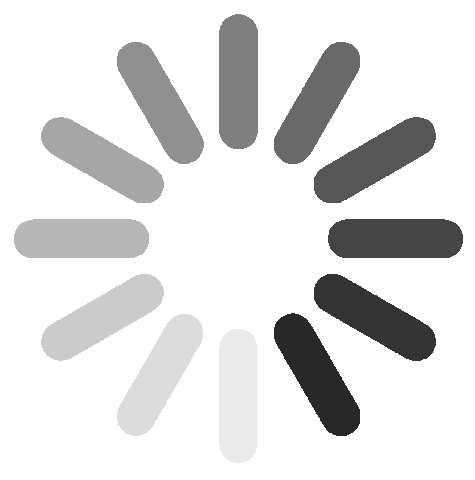

In [161]:
# visualise
topic_model.visualize_document_datamap(docs=doc_token, 
                                          reduced_embeddings=embeddings_tsne_2d, 
                                          interactive=True)

In [74]:
from joblib import dump, load

In [169]:
topic_model.topic_labels_

{0: '0_molecules_molecule_generation_diffusion',
 1: '1_drug_data_drugs_model',
 2: '2_molecules_molecule_learning_model',
 3: '3_ligand_protein_docking_model',
 4: '4_model_learning_drug_models',
 5: '5_value_drug_graph_knowledge',
 6: '6_graph_graphs_learning_model',
 7: '7_drug_target_network_prediction',
 8: '8_cancer_cell_drug_cells',
 9: '9_water_membrane_lipid_phase',
 10: '10_molecules_ligand_protein_structure',
 11: '11_materials_surface_mofs_energy',
 12: '12_protein_structure_sequence_proteins',
 13: '13_protein_ligand_model_target',
 14: '14_sars_network_protein_drug'}

In [170]:
for t in topic_model.get_topic_info().Topic:
    if t == -1: continue
    words = [w for w, _ in topic_model.get_topic(t)]
    print(f"Topic {t:2d}: “{', '.join(words[:6])}…”")

Topic  0: “molecules, molecule, generation, diffusion, atom, model…”
Topic  1: “drug, data, drugs, model, patient, information…”
Topic  2: “molecules, molecule, learning, model, quantum, properties…”
Topic  3: “ligand, protein, docking, model, structure, structures…”
Topic  4: “model, learning, drug, models, data, molecule…”
Topic  5: “value, drug, graph, knowledge, information, node…”
Topic  6: “graph, graphs, learning, model, prediction, models…”
Topic  7: “drug, target, network, prediction, graph, model…”
Topic  8: “cancer, cell, drug, cells, drugs, model…”
Topic  9: “water, membrane, lipid, phase, release, delivery…”
Topic 10: “molecules, ligand, protein, structure, docking, model…”
Topic 11: “materials, surface, mofs, energy, temperature, time…”
Topic 12: “protein, structure, sequence, proteins, structures, antibody…”
Topic 13: “protein, ligand, model, target, affinity, learning…”
Topic 14: “sars, network, protein, drug, virus, proteins…”


In [171]:
topic_labels = {
    0:  "Molecular Generation & Diffusion",
    1:  "Patient Drug Data",
    2:  "Quantum Molecular Properties",
    3:  "Ligand Docking Modeling",
    4:  "Drug Molecule Modeling",
    5:  "Drug Knowledge Graphs",
    6:  "Graph Learning Models",
    7:  "Drug Target Prediction",
    8:  "Cancer Drug Modeling",
    9:  "Lipid Membrane Delivery",
    10: "Protein–Ligand Structure Modeling",
    11: "MOF Surface Energy",
    12: "Antibody Sequence & Structure",
    13: "Protein–Ligand Affinity Modeling",
    14: "SARS Protein Networks"
}
topic_model.set_topic_labels(topic_labels)

In [200]:
topic_labels

{0: 'Molecular Generation & Diffusion',
 1: 'Patient Drug Data',
 2: 'Quantum Molecular Properties',
 3: 'Ligand Docking Modeling',
 4: 'Drug Molecule Modeling',
 5: 'Drug Knowledge Graphs',
 6: 'Graph Learning Models',
 7: 'Drug Target Prediction',
 8: 'Cancer Drug Modeling',
 9: 'Lipid Membrane Delivery',
 10: 'Protein–Ligand Structure Modeling',
 11: 'MOF Surface Energy',
 12: 'Antibody Sequence & Structure',
 13: 'Protein–Ligand Affinity Modeling',
 14: 'SARS Protein Networks'}

In [202]:
dump(embeddings, r"C:\Users\Philippa\Documents\GitHub\crystalline-mining\textual_analysis\BERTopic_embeddings.npy")

['C:\\Users\\Philippa\\Documents\\GitHub\\crystalline-mining\\textual_analysis\\BERTopic_embeddings.npy']

In [201]:
dump(topic_model, r"C:\Users\Philippa\Documents\GitHub\crystalline-mining\textual_analysis\BERTopic_model.pkl")

['C:\\Users\\Philippa\\Documents\\GitHub\\crystalline-mining\\textual_analysis\\BERTopic_model.pkl']

In [175]:
import pandas as pd
df_topics = topic_model.get_document_info(docs=doc_token, df=None, metadata=None)

for topic_id, label in topic_labels.items():
    docs = df_topics[df_topics.Topic == topic_id].Document.tolist()
    print(f"--- {label} (Topic {topic_id}) ---")
    for d in docs[:5]:
        print(" -", d)
    print()

--- Molecular Generation & Diffusion (Topic 0) ---
 - Optical Properties Drug Metabolites Latent Fingermarks Shen Qing School Forensic Science People Public Security University China Beijing China Department Physics Applied Optics Beijing Area Major Laboratory Beijing Normal University Beijing China Drug metabolites structures split ring resonators SRRs permittivity ability field result region fingermarks images drug addicts drug users properties fingermarks drug addicts users technic superiority crime scene investigation paper permittivity permeability drug metabolites model fingermarks smokers smokers example index material Veselago permittivity permeability Pendry discussion configuration split ring resonator refraction practice configurations symmetry breaking refraction focus research example lenses field detection sensitivity years Shelby Metamaterial SRRs molecules SRRs metal atom chains branch study directions cloaking moment crystal control hand science surface fingermarks met

In [209]:
dump(texts, r"C:\Users\Philippa\Documents\GitHub\crystalline-mining\textual_analysis\Raw_texts.npy")

['C:\\Users\\Philippa\\Documents\\GitHub\\crystalline-mining\\textual_analysis\\Raw_texts.npy']